### An Initial Linear Model of Online Spend

In [100]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
cust_df = pd.read_csv('data/006_part1.csv')
cust_df.head()
cust_df.describe(include='all')

,cust_id,age,credit_score,email,distance_to_store,online_visits,online_trans,online_spend,store_trans,store_spend,sat_service,sat_selection
count,1000.000000,1000.000000,1000.000000,1000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,659.000000,659.000000
unique,NaN,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,814,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,500.500000,34.922050,725.488402,NaN,14.655254,28.293000,8.385000,170.318241,1.323000,47.582099,3.069803,2.400607
std,288.819436,4.944598,50.248973,NaN,22.936412,53.579678,15.997334,327.813183,1.612846,67.963508,0.868907,0.894291
min,1.000000,19.341341,542.970848,NaN,0.213602,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
25%,250.750000,31.427312,691.695470,NaN,3.338284,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,2.000000
50%,500.500000,35.104230,725.457422,NaN,7.131707,6.000000,2.000000,37.029027,1.000000,30.053884,3.000000,2.000000
75%,750.250000,38.200034,757.201286,NaN,16.658860,31.000000,9.000000,177.888022,2.000000,66.489555,4.000000,3.000000


In [101]:
# Online spend is closely related to the number of online transactions (coefﬁcient = 20.6) but not
# the number of online visits. That is puzzling. Second, the model accounts for almost
# all the available variance, R2 = 0.98. These results should cause concern. And notice that the
# standard error on store_trans is quite large, showing that its estimate is very uncertain.

import statsmodels.formula.api as smf
spend_m1 = smf.ols('online_spend ~ age + credit_score + email'
                    '+ distance_to_store + online_visits'
                    '+ online_trans + store_trans + store_spend '
                    '+ sat_service + sat_selection',
                    data=cust_df.loc[cust_df.online_spend > 0,
                                     'age':]).fit()
spend_m1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           online_spend   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.983
Method:                 Least Squares   F-statistic:                     2363.
Date:                Mon, 30 Aug 2021   Prob (F-statistic):               0.00
Time:                        14:54:13   Log-Likelihood:                -2157.5
No. Observations:                 418   AIC:                             4337.
Df Residuals:                     407   BIC:                             4381.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             6.7189     33.538      0.200      0.841     -59.210      72.648
email[T.yes]         -5.6893      5.807     -0.980      0.328     -17.104       5.725
age                   0.4228      0.451      0.938      0.349      -0.463       1.309
credit_score         -0.0337      0.044     -0.766      0.444      -0.120       0.053
distance_to_store    -0.0435      0.101     -0.433      0.665      -0.241       0.154
online_visits        -0.0723      0.204     -0.354      0.723      -0.473       0.329
online_trans         20.6107      0.667     30.880      0.000      19.299      21.923
store_trans           0.1350      3.212      0.042      0.966      -6.179       6.449
store_spend           0.0018      0.079      0.023      0.982      -0.153       0.157
sat_service           5.6388      3.016      1.870      0.062      -0.290      11.568
sat_selection        -4.3706      2.909     -1.502      0.134     -10.089       1.348
==============================================================================
Omnibus:                       85.767   Durbin-Watson:                   1.980
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1424.804
Skew:                          -0.279   Prob(JB):                    4.05e-310
Kurtosis:                      12.028   Cond. No.                     1.17e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.17e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

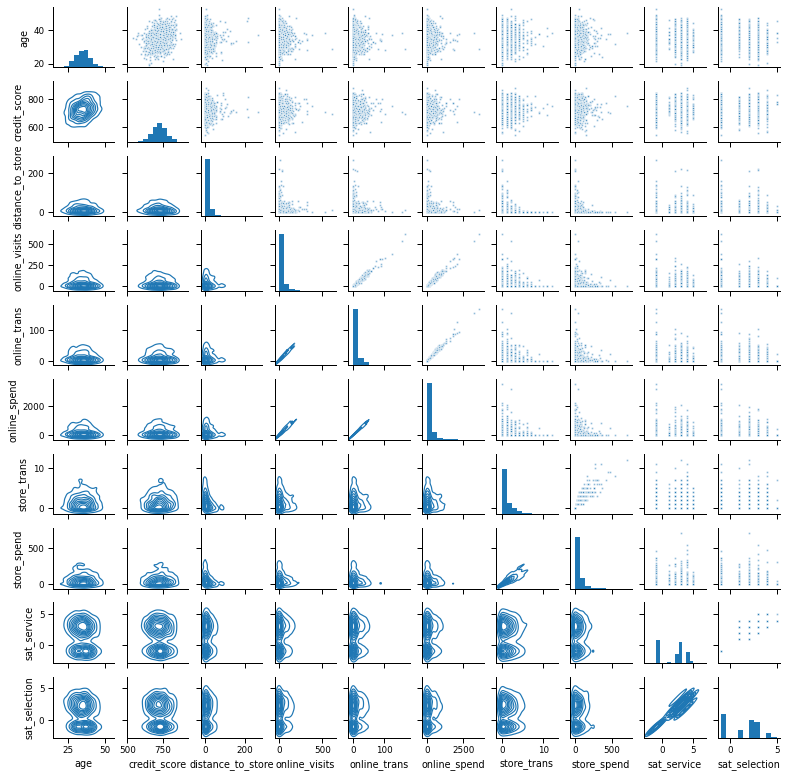

In [102]:
# See variables with extreme skew (diagonal) and pairs of variables that are very highly correlated.
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_context('paper')

g = sns.PairGrid(cust_df.loc[:, 'age':].fillna(-1), height=1.1)
g.map_upper(plt.scatter, linewidths=1, edgecolor="w", s=5, alpha=0.5)
g.map_diag(plt.hist)
g.map_lower(sns.kdeplot)

In [103]:
# Remediate the skewness by transforming the data using a Box-Cox transformation.
import scipy.stats as ss
import sklearn.preprocessing as pp

def autotransform(x):
  '''Return scaled Box-Cox transform of x'''
  x_bc, lmbd = ss.boxcox(1 + x)
  return pp.scale(x_bc)

In [104]:
cust_df.head()

,cust_id,age,credit_score,email,distance_to_store,online_visits,online_trans,online_spend,store_trans,store_spend,sat_service,sat_selection
0,1,22.894369,630.608883,yes,2.582494,20,3,58.429989,4,140.323213,3.0,3.0
1,2,28.049944,748.574644,yes,48.175989,121,39,756.880083,0,0.000000,3.0,3.0
2,3,35.879417,732.545858,yes,1.285712,39,14,250.328006,0,0.000000,NaN,NaN
3,4,30.527395,829.588862,yes,5.253992,1,0,0.000000,2,95.911944,4.0,2.0
4,5,38.735747,733.796825,no,25.044693,35,11,204.693314,0,0.000000,1.0,1.0


In [105]:
idx_complete = (cust_df.isna().sum(axis=1) == 0)
cust_df_bc = cust_df.loc[(idx_complete) &
                         (cust_df.online_spend > 0), 'age':].copy()
col_idx = cust_df_bc.columns != 'email'
cust_df_bc.iloc[:, col_idx] = \
  cust_df_bc.iloc[:, col_idx].apply(autotransform)

In [106]:
# The result is a dataframe with standardized, more normally distributed values, which we can check
# with describe() and PairGrid().
cust_df_bc.describe(include='all')

,age,credit_score,email,distance_to_store,online_visits,online_trans,online_spend,store_trans,store_spend,sat_service,sat_selection
count,4.180000e+02,4.180000e+02,418,4.180000e+02,4.180000e+02,4.180000e+02,4.180000e+02,4.180000e+02,4.180000e+02,4.180000e+02,4.180000e+02
unique,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,351,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,4.164664e-16,1.323768e-15,NaN,2.900391e-16,2.379808e-16,-1.912346e-16,-3.824692e-16,1.976091e-16,-1.349266e-16,1.954842e-16,-7.436901e-17
std,1.001198e+00,1.001198e+00,NaN,1.001198e+00,1.001198e+00,1.001198e+00,1.001198e+00,1.001198e+00,1.001198e+00,1.001198e+00,1.001198e+00
min,-2.525865e+00,-3.133591e+00,NaN,-2.482177e+00,-1.939639e+00,-1.438329e+00,-1.732505e+00,-1.198006e+00,-1.254557e+00,-2.308468e+00,-1.585538e+00
25%,-6.206139e-01,-6.919065e-01,NaN,-7.576951e-01,-7.620196e-01,-9.718337e-01,-8.248353e-01,-1.198006e+00,-1.254557e+00,-7.999429e-02,-3.730294e-01
50%,1.854191e-02,-1.658130e-02,NaN,1.882395e-02,-6.197988e-03,-1.589281e-02,1.977403e-02,1.181188e-01,3.119227e-01,-7.999429e-02,-3.730294e-01
75%,6.384594e-01,6.714929e-01,NaN,7.303464e-01,8.241394e-01,8.807929e-01,8.795506e-01,7.682788e-01,7.736117e-01,1.104214e+00,7.370455e-01


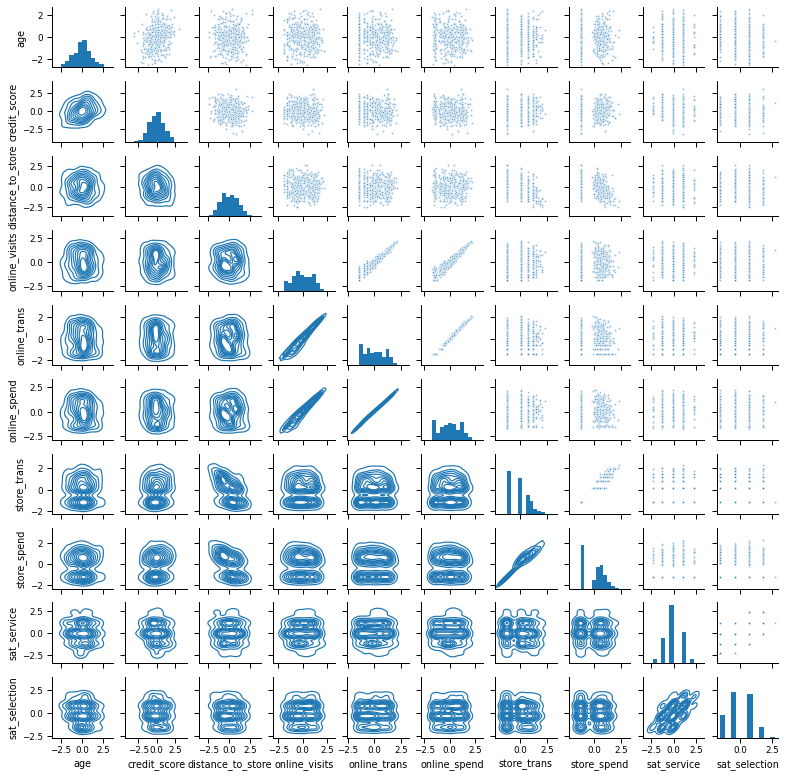

In [107]:
g = sns.PairGrid(cust_df_bc, height=1.1,)
g.map_upper(plt.scatter, linewidths=1, edgecolor="w", s=5, alpha=0.5)
g.map_diag(plt.hist)
g.map_lower(sns.kdeplot)

In [108]:
# We reﬁt the model using the transformed data.
# Transforming and standardizing the data, although a good idea, have not changed the unbelievable
# estimate that online spend is highly related to transactions yet unrelated to visits.
spend_m2 = smf.ols('online_spend ~ age + credit_score + email'
                    '+ distance_to_store + online_visits'
                    '+ online_trans + store_trans + store_spend '
                    '+ sat_service + sat_selection',
                    data=cust_df_bc).fit()
spend_m2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           online_spend   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.992
Method:                 Least Squares   F-statistic:                     5110.
Date:                Mon, 30 Aug 2021   Prob (F-statistic):               0.00
Time:                        14:58:10   Log-Likelihood:                 418.56
No. Observations:                 418   AIC:                            -815.1
Df Residuals:                     407   BIC:                            -770.7
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            -0.0035      0.011     -0.313      0.755      -0.026       0.019
email[T.yes]          0.0042      0.012      0.340      0.734      -0.020       0.028
age                   0.0015      0.005      0.322      0.747      -0.008       0.011
credit_score         -0.0039      0.005     -0.839      0.402      -0.013       0.005
distance_to_store    -0.0031      0.005     -0.598      0.550      -0.013       0.007
online_visits         0.0067      0.016      0.415      0.678      -0.025       0.038
online_trans          0.9892      0.016     61.297      0.000       0.957       1.021
store_trans          -0.0068      0.018     -0.385      0.701      -0.041       0.028
store_spend           0.0079      0.017      0.458      0.647      -0.026       0.042
sat_service           0.0048      0.005      0.884      0.377      -0.006       0.016
sat_selection         0.0006      0.005      0.112      0.911      -0.010       0.011
==============================================================================
Omnibus:                        0.082   Durbin-Watson:                   1.870
Prob(Omnibus):                  0.960   Jarque-Bera (JB):                0.063
Skew:                          -0.030   Prob(JB):                        0.969
Kurtosis:                       2.992   Cond. No.                         8.57
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [109]:
# The full model is no better than one that simply predicts spending from the number of transactions
# alone. The small difference between the model fits is reflected in the very low F statistics 
# (leading to an undefined p-value), and thus the null hypothesis of no difference between the 
# models cannot be rejected.
spend_m3 = smf.ols('online_spend ~ online_trans',
                    data=cust_df_bc).fit()
from statsmodels.stats import anova as sms_anova
sms_anova.anova_lm(spend_m2, spend_m3)

,df_resid,ssr,df_diff,ss_diff,F,Pr(>F)
0,407.0,3.303249,0.0,NaN,NaN,NaN
1,416.0,3.330058,-9.0,-0.02681,0.372126,NaN


The problem here is collinearity: because visits and transactions are so highly related, and also because a linear model assumes that effects are additive, an effect attributed to one variable (such as transactions) is not available in the model to be attributed jointly to another that is highly correlated (visits). This will cause the standard errors of the predictors to increase, which means that the coefﬁcient estimates will be highly uncertain or unstable. As a practical consequence, this may cause coefﬁcient estimates to differ dramatically from sample to sample due to minor variations in the data even when underlying relationships are the same.

### Remediating Collinearity

The degree of collinearity in data can be assessed as the variance inﬂation factor (VIF). This estimates how much the standard error (variance) of a coefﬁcient in a linear model is increased because of shared variance with other variables, compared to the situation if the variables were uncorrelated or simple single predictor regression were performed.

In [110]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# exog_idx indicates which term to assess, here 1, 0 index corresponds to the intercept.
variance_inflation_factor(spend_m2.model.exog, 1)

1.050593450857078

In [111]:
# But we want to look at this for all coefﬁcients.#

# A common rule of thumb is that VIF > 5.0 indicates a need to mitigate collinearity. In spend_m2,
# the VIF suggests that collinearity should be addressed for the online... and store...variables. 
# Note that we generally ignore the intercept term, as the VIF of the intercept is not easily 
# interpretable.
def print_variance_inflation_factors(model):
  for i, param in enumerate(model.params.index):
    print('VIF: {:.3f}, Parameter: {}'.format(
        variance_inflation_factor(model.model.exog, i), param))

print_variance_inflation_factors(spend_m2)

VIF: 6.504, Parameter: Intercept
VIF: 1.051, Parameter: email[T.yes]
VIF: 1.095, Parameter: age
VIF: 1.112, Parameter: credit_score
VIF: 1.375, Parameter: distance_to_store
VIF: 13.354, Parameter: online_visits
VIF: 13.413, Parameter: online_trans
VIF: 15.977, Parameter: store_trans
VIF: 15.254, Parameter: store_spend
VIF: 1.524, Parameter: sat_service
VIF: 1.519, Parameter: sat_selection


In [112]:
# One way to deal with high collinearity: omit highly correlated variables for model spend_m4 by 
# excluding online_transand store_trans.
spend_m4 = smf.ols('online_spend ~ age + credit_score + email'
                    '+ distance_to_store + online_visits'
                    '+ store_spend + sat_service + sat_selection',
                    data=cust_df_bc).fit()
spend_m4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           online_spend   R-squared:                       0.919
Model:                            OLS   Adj. R-squared:                  0.917
Method:                 Least Squares   F-statistic:                     580.0
Date:                Mon, 30 Aug 2021   Prob (F-statistic):          7.05e-218
Time:                        14:58:11   Log-Likelihood:                -67.849
No. Observations:                 418   AIC:                             153.7
Df Residuals:                     409   BIC:                             190.0
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            -0.0637      0.036     -1.781      0.076      -0.134       0.007
email[T.yes]          0.0758      0.039      1.938      0.053      -0.001       0.153
age                  -0.0259      0.015     -1.771      0.077      -0.055       0.003
credit_score          0.0015      0.015      0.104      0.917      -0.028       0.031
distance_to_store    -0.0046      0.016     -0.288      0.773      -0.036       0.027
online_visits         0.9534      0.014     66.818      0.000       0.925       0.981
store_spend           0.0047      0.016      0.291      0.771      -0.027       0.036
sat_service          -0.0076      0.017     -0.440      0.660      -0.042       0.026
sat_selection         0.0017      0.017      0.098      0.922      -0.032       0.036
==============================================================================
Omnibus:                       30.984   Durbin-Watson:                   2.076
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               39.684
Skew:                          -0.596   Prob(JB):                     2.41e-09
Kurtosis:                       3.927   Cond. No.                         4.92
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [113]:
# Is okay.
print_variance_inflation_factors(spend_m4)

VIF: 6.450, Parameter: Intercept
VIF: 1.040, Parameter: email[T.yes]
VIF: 1.082, Parameter: age
VIF: 1.104, Parameter: credit_score
VIF: 1.299, Parameter: distance_to_store
VIF: 1.028, Parameter: online_visits
VIF: 1.313, Parameter: store_spend
VIF: 1.518, Parameter: sat_service
VIF: 1.518, Parameter: sat_selection


In [114]:
# Another approach (to deal with high collinearity) is to use the principal components of the 
# correlated data.

# Principal components analysis breaks down a multidimensional dataset into components that are 
# uncorrelated (orthogonal). Thus, PCA provides a way to extract composite variables that
# are by deﬁnition free of collinearity with other variables that are included in the same PCA.
# We use PCA to extract the first component for the online variables, and then do this again for the
# store variables, and add those two initial components to the dataframe.

from sklearn import decomposition

# Create a combined online variable using PCA.
online_pca = (
    decomposition.PCA()
    .fit_transform(
      cust_df_bc[['online_visits','online_trans']]))
cust_df_bc['online'] = online_pca[:,0]

# Create a combined store variable using PCA.
store_pca = (
    decomposition.PCA().
    fit_transform(
        cust_df_bc[['store_spend', 'store_trans']]))
cust_df_bc['store'] = store_pca[:,0]

In [115]:
spend_m5 = smf.ols('online_spend ~ age + credit_score + email'
                   '+ distance_to_store + online + store'
                   '+ sat_service + sat_selection',
                    data=cust_df_bc).fit()
spend_m5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           online_spend   R-squared:                       0.974
Model:                            OLS   Adj. R-squared:                  0.973
Method:                 Least Squares   F-statistic:                     1887.
Date:                Mon, 30 Aug 2021   Prob (F-statistic):          1.95e-317
Time:                        14:58:11   Log-Likelihood:                 166.61
No. Observations:                 418   AIC:                            -315.2
Df Residuals:                     409   BIC:                            -278.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            -0.0267      0.020     -1.306      0.192      -0.067       0.013
email[T.yes]          0.0318      0.022      1.420      0.156      -0.012       0.076
age                  -0.0121      0.008     -1.451      0.148      -0.029       0.004
credit_score          0.0002      0.008      0.022      0.982      -0.016       0.017
distance_to_store    -0.0037      0.009     -0.395      0.693      -0.022       0.015
online                0.7028      0.006    120.640      0.000       0.691       0.714
store                 0.0013      0.007      0.188      0.851      -0.012       0.014
sat_service          -0.0010      0.010     -0.100      0.920      -0.020       0.018
sat_selection         0.0005      0.010      0.049      0.961      -0.019       0.020
==============================================================================
Omnibus:                       13.541   Durbin-Watson:                   2.024
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               17.094
Skew:                          -0.312   Prob(JB):                     0.000194
Kurtosis:                       3.770   Cond. No.                         5.69
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

VIF poses no problem in this model, and we see that online spend is still associated primarily with online activity (as captured in the ﬁrst component of the PCA model, online). One caution when interpreting results that use principal components as explanatory variables is that the components have arbitrary numerical direction; online could have a negative coefficient here, but that would not necessarily imply that online activity results in lower sales.

In [116]:
print_variance_inflation_factors(spend_m5)

VIF: 6.474, Parameter: Intercept
VIF: 1.045, Parameter: email[T.yes]
VIF: 1.082, Parameter: age
VIF: 1.102, Parameter: credit_score
VIF: 1.337, Parameter: distance_to_store
VIF: 1.032, Parameter: online
VIF: 1.350, Parameter: store
VIF: 1.518, Parameter: sat_service
VIF: 1.519, Parameter: sat_selection


## Linear Models for Binary Outcomes: Logistic Regression

yes/no outcomes: did a customer purchase a product? Did she take a test drive? Did she sign up for
a credit card, or renew her subscription, or respond to a promotion? All of these kinds of outcomes are binary because they have only two possible observed states: yes or no. <br>
It is tempting to fit such a model with a typical linear regression model, predicting the outcome (1=yes, 0=no) as a linear combination of the features. That is not incorrect to do, but a more flexible and useful way
to fit such outcomes is with a logistic model (also called a logit model).<br><br>
The core feature of a logistic model is that it relates the probability of an outcome to an exponential function of a predictor variable. By modeling the probability of an outcome, a logistic model accomplishes two things. First, it more directly models what we're interested in, which is a probability or proportion, such as the likelihood of a given customer to purchase a product, or the expected proportion of a segment who will respond to a promotion. Second, it limits the model to the appropriate range for a proportion, which is [0, 1]. A basic linear model as generated with ols() does not have such a limit and could estimate a nonsensical probability such as 1.05 or −0.04.

### Basics of the Logistic Regression Model

### Data for Logistic Regression of Season Passes
(expressions logit model and logistic regression are used interchangeably)

Suppose that we now have data on the sales of season tickets to the
park. The data consist of a table of season ticket pass sales (with values of YesPass or NoPass), on the basis of two factors: the channel
used to extend the offer (email, postal mail, or in-person at the park) and whether it was promoted in a bundle offering the
season ticket with another feature such as free parking, or not. <br>
The question is this: are customers more likely to purchase the season pass when it is offered in the bundle (with free parking), or not? This is modeled as: Pass ~ Promo.

In [117]:
pass_df = pd.read_csv('data/006_part2.csv')
pass_df.head()

,Channel,Promo,Pass
0,Mail,Bundle,YesPass
1,Mail,Bundle,YesPass
2,Mail,Bundle,YesPass
3,Mail,Bundle,YesPass
4,Mail,Bundle,YesPass


In [118]:
pass_df.dtypes # Promo and Pass must be categorical.

Channel    object
Promo      object
Pass       object
dtype: object

In [119]:
pass_df.Pass = pass_df.Pass.astype(
    pd.api.types.CategoricalDtype(categories=['YesPass','NoPass'],
                                  ordered=True))
pass_df.Promo = pass_df.Promo.astype(
    pd.api.types.CategoricalDtype(categories=['NoBundle','Bundle'],
                                  ordered=True))
pass_df.dtypes

Channel      object
Promo      category
Pass       category
dtype: object

In [155]:
# NoBundle: 0, Bundle: 1.
# YesPass: 0, NoPass: 1.
for col in pass_df:
    print(pass_df[col].unique())

['Mail' 'Park' 'Email']
['Bundle', 'NoBundle']
Categories (2, object): ['NoBundle' < 'Bundle']
['YesPass', 'NoPass']
Categories (2, object): ['YesPass' < 'NoPass']


In [120]:
pass_df.describe()

,Channel,Promo,Pass
count,3156,3156,3156
unique,3,2,2
top,Mail,Bundle,YesPass
freq,1328,1674,1589


### Sales Table Data

In [121]:
pass_df.groupby(['Pass', 'Promo', 'Channel']).Pass.count().unstack(level=2).T

Pass     YesPass          NoPass       
Promo   NoBundle Bundle NoBundle Bundle
Channel                                
Email         27     38      485     83
Mail         359    242      278    449
Park         284    639       49    223

### Fitting a Logistic Regression Model

In [122]:
# A logistic regression model in Python is fit as a generalized linear model (GLM).

# The initial model appears to confirm that the bundle is effective. There is a positive coefficient
# for the bundle condition, and the effect is statistically significant.
import statsmodels.api as sm
import statsmodels.formula.api as smf

pass_m1 = smf.glm('Pass ~ Promo', data=pass_df,
                  family=sm.families.Binomial()).fit() # family= specifies the distribution for the outcome variable.
pass_m1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                         Generalized Linear Model Regression Results                         
=============================================================================================
Dep. Variable:     ['Pass[YesPass]', 'Pass[NoPass]']   No. Observations:                 3156
Model:                                           GLM   Df Residuals:                     3154
Model Family:                               Binomial   Df Model:                            1
Link Function:                                 logit   Scale:                          1.0000
Method:                                         IRLS   Log-Likelihood:                -2172.7
Date:                               Mon, 30 Aug 2021   Deviance:                       4345.4
Time:                                       14:58:13   Pearson chi2:                 3.16e+03
No. Iterations:                                    4                                         
Covariance Type:                           nonrobust                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -0.1922      0.052     -3.683      0.000      -0.295      -0.090
Promo[T.Bundle]     0.3888      0.072      5.425      0.000       0.248       0.529
===================================================================================
"""

In [123]:
# What does a coefficient of Promo[T.Bundle] of 0.3888 mean?
# ratio of outcome % to alternative %
expit(0.3888) / (1-expit(0.3888))

# The odds that customers are purchase the pass when it is offered in the bundle are 1.475 times
# higher than when it is not.

1.4752094799309121

In [124]:
np.exp(0.3888) # Identical.

1.4752094799309121

In [128]:
# We can find the odds ratios from the model by extracting the coefficients from the params 
# attribute on the model object and using exp().
np.exp(pass_m1.params)

Intercept          0.825123
Promo[T.Bundle]    1.475196
dtype: float64

In [129]:
# The odds ratio for the promotion bundle is estimated to be between 1.28 and 1.70, a significant 
# positive effect. But is the model Pass ∼ Promo really the one we should interpret?
np.exp(pass_m1.conf_int())

,0,1
Intercept,0.744890,0.913998
Promo[T.Bundle],1.281868,1.697681


### Reconsidering the model

In [130]:
# Park channel is important for selling passes.
pass_df.groupby(['Pass']).Channel.value_counts().unstack()

Channel,Email,Mail,Park
Pass,,,
YesPass,65,601,923
NoPass,568,727,272


<AxesSubplot:ylabel='Pass'>

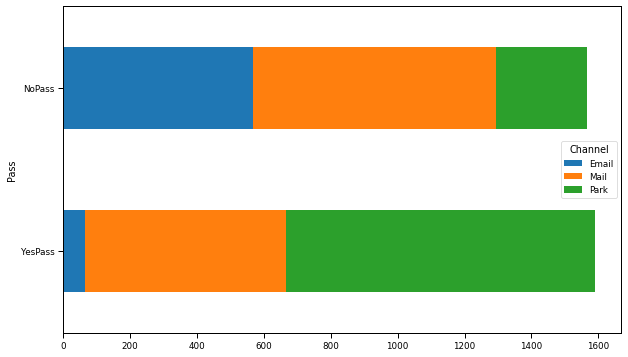

In [131]:
pass_df.groupby(['Pass']).Channel.value_counts().unstack()\
  .plot(kind='barh', stacked=True, figsize=(10,6))

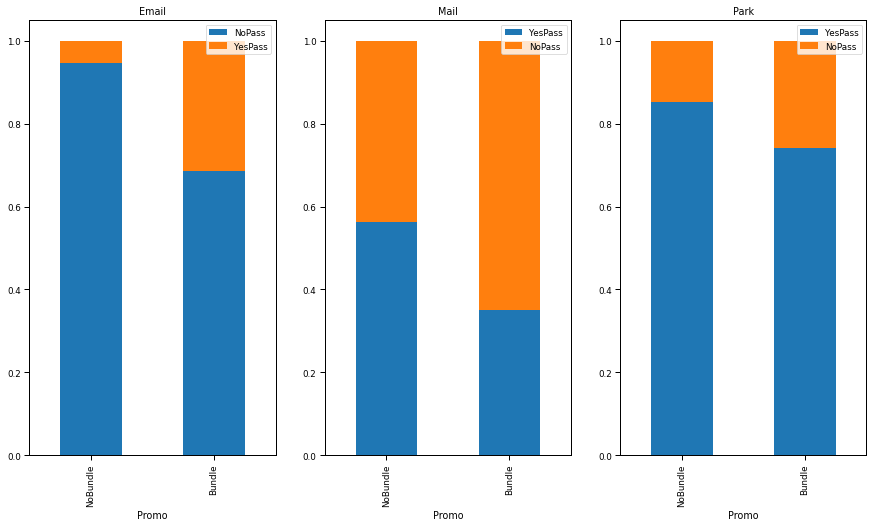

In [132]:
f = plt.figure(figsize=(15,8))
axs = f.subplots(1,3)
for ax, (c, channel_group) in zip(axs, pass_df.groupby("Channel")):
  ax = channel_group\
   .groupby("Promo")\
   .Pass.value_counts(normalize=True).unstack()\
   .plot(kind='bar', ax=ax, stacked=True)
  ax.set_title(c)

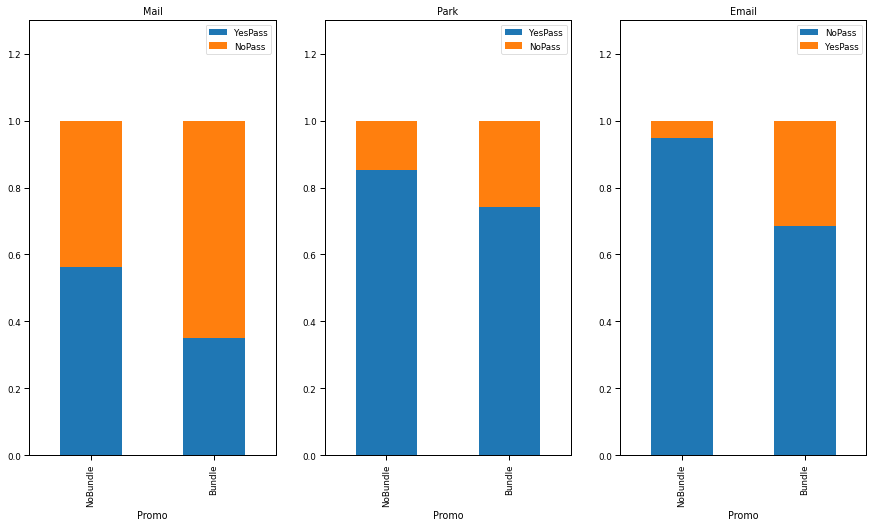

In [133]:
channels = ['Mail', 'Park', 'Email']
plt.figure(figsize=(15,8))
for i,c in enumerate(channels):
  ax = plt.subplot(1, 3, i+1)
  pass_df.loc[pass_df.Channel == c]\
    .groupby('Promo').Pass.value_counts(normalize=True).unstack()\
    .plot(kind='bar', ax=ax, stacked=True)
  plt.title(c)
  plt.ylim((0,1.3))

We see that the three channels have somewhat different effects. Sales of season passes are very
successful at the park, and very unsuccessful by email. This implies that our model Pass ∼ Promo may
be inadequate and needs to account for the effect of Channel.
We model a main effect of channel by adding + Channel to the model formula.

In [134]:
# The resulting model now estimates a strong negative contribution of the promotion bundle.
pass_m2 = smf.glm('Pass ~ Promo + Channel',
                  data=pass_df,
                  family=sm.families.Binomial()).fit()
pass_m2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                         Generalized Linear Model Regression Results                         
=============================================================================================
Dep. Variable:     ['Pass[YesPass]', 'Pass[NoPass]']   No. Observations:                 3156
Model:                                           GLM   Df Residuals:                     3152
Model Family:                               Binomial   Df Model:                            3
Link Function:                                 logit   Scale:                          1.0000
Method:                                         IRLS   Log-Likelihood:                -1745.1
Date:                               Mon, 30 Aug 2021   Deviance:                       3490.2
Time:                                       14:58:19   Pearson chi2:                 3.30e+03
No. Iterations:                                    5                                         
Covariance Type:                           nonrobust                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -2.0786      0.132    -15.785      0.000      -2.337      -1.821
Promo[T.Bundle]    -0.5602      0.090     -6.203      0.000      -0.737      -0.383
Channel[T.Mail]     2.1762      0.147     14.853      0.000       1.889       2.463
Channel[T.Park]     3.7218      0.160     23.312      0.000       3.409       4.035
===================================================================================
"""

In [135]:
# We compute the odds ratios and their confidence intervals.
np.exp(pass_m2.params)

Intercept           0.125105
Promo[T.Bundle]     0.571085
Channel[T.Mail]     8.812507
Channel[T.Park]    41.337121
dtype: float64

In [136]:
np.exp(pass_m2.conf_int())

,0,1
Intercept,0.096648,0.161943
Promo[T.Bundle],0.478438,0.681672
Channel[T.Mail],6.612766,11.743993
Channel[T.Park],30.230619,56.524069


In [137]:
# But is above model the appropriate model? Should we also consider an interaction effect, where 
# Promo might have a different effect by Channel?

# The interaction of promotion with channel is statistically significant, and is strongly negative 
# for the mail and in-park channels.
pass_m3 = smf.glm('Pass ~ Promo + Channel + Promo:Channel',
                  data=pass_df,
                  family=sm.families.Binomial()).fit()
pass_m3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                         Generalized Linear Model Regression Results                         
=============================================================================================
Dep. Variable:     ['Pass[YesPass]', 'Pass[NoPass]']   No. Observations:                 3156
Model:                                           GLM   Df Residuals:                     3150
Model Family:                               Binomial   Df Model:                            5
Link Function:                                 logit   Scale:                          1.0000
Method:                                         IRLS   Log-Likelihood:                -1696.8
Date:                               Mon, 30 Aug 2021   Deviance:                       3393.5
Time:                                       14:58:20   Pearson chi2:                 3.16e+03
No. Iterations:                                    6                                         
Covariance Type:                           nonrobust                                         
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept                          -2.8883      0.198    -14.607      0.000      -3.276      -2.501
Promo[T.Bundle]                     2.1071      0.278      7.571      0.000       1.562       2.653
Channel[T.Mail]                     3.1440      0.213     14.742      0.000       2.726       3.562
Channel[T.Park]                     4.6455      0.251     18.504      0.000       4.153       5.138
Promo[T.Bundle]:Channel[T.Mail]    -2.9808      0.300     -9.925      0.000      -3.570      -2.392
Promo[T.Bundle]:Channel[T.Park]    -2.8115      0.328     -8.577      0.000      -3.454      -2.169
===================================================================================================
"""

In [138]:
np.exp(pass_m3.conf_int())

,0,1
Intercept,0.037784,0.082023
Promo[T.Bundle],4.766238,14.190288
Channel[T.Mail],15.272038,35.233701
Channel[T.Park],63.650609,170.293436
Promo[T.Bundle]:Channel[T.Mail],0.028170,0.091430
Promo[T.Bundle]:Channel[T.Park],0.031621,0.114288


## An introduction to Hierarchical Models

### Ratings-Based Conjoint Analysis for the Amusement Park

The park is considering designs for a new roller coaster and hopes to find out which roller coaster features (which combination of features) appeal to its customers.

In [139]:
conjoint_df = pd.read_csv('data/006_part3_ratings.csv')
conjoint_df.speed = conjoint_df.speed.astype('category')
conjoint_df.height = conjoint_df.height.astype('category')
conjoint_df.describe(include='all')

,speed,height,const,theme,rating,resp_id
count,3200.0,3200.0,3200,3200,3200.000000,3200.000000
unique,4.0,3.0,2,2,NaN,NaN
top,40.0,200.0,Steel,Dragon,NaN,NaN
freq,800.0,1400.0,2000,1800,NaN,NaN
mean,NaN,NaN,NaN,NaN,5.450000,99.500000
std,NaN,NaN,NaN,NaN,2.810688,57.743328
min,NaN,NaN,NaN,NaN,1.000000,0.000000
25%,NaN,NaN,NaN,NaN,3.000000,49.750000
50%,NaN,NaN,NaN,NaN,5.000000,99.500000
75%,NaN,NaN,NaN,NaN,8.000000,149.250000


In [156]:
conjoint_df.head() # Each respondent has a resp_id, so each respondent can have provided more than one rating, e.g., in a survey.

,speed,height,const,theme,rating,resp_id
0,70,200,Steel,Dragon,9,0
1,40,400,Wood,Dragon,6,0
2,70,300,Steel,Eagle,8,0
3,40,400,Wood,Dragon,7,0
4,50,200,Steel,Eagle,1,0


### An Initial Linear Model

In [140]:
# Ratings of the designs range from 1 (strongly disprefer) to 10 (strongly prefer).
conjoint_df.groupby('height').rating.mean()

height
200    4.758571
300    6.958000
400    4.775000
Name: rating, dtype: float64

In [141]:
# The highest rated roller coaster on average would have a top speed of 70 mph, a height of 300ft,
# steel construction, and the dragon theme (steel and dragon because wood and eagle have negative
# values). We estimate an overall rating for this most-desired coaster; it would be
# the intercept + speed_70 + height_300 (steel and dragon are included in the intercept), or
# 2.69 + 4.59 + 2.92 = 10.20 points on our 10-point rating scale.
import statsmodels.formula.api as smf
ride_lm = smf.ols('rating ~ speed + height + const + theme',
                    data=conjoint_df).fit()
ride_lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rating   R-squared:                       0.470
Model:                            OLS   Adj. R-squared:                  0.469
Method:                 Least Squares   F-statistic:                     404.5
Date:                Mon, 30 Aug 2021   Prob (F-statistic):               0.00
Time:                        14:58:20   Log-Likelihood:                -6831.1
No. Observations:                3200   AIC:                         1.368e+04
Df Residuals:                    3192   BIC:                         1.373e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          2.6953      0.113     23.888      0.000       2.474       2.917
speed[T.50]        0.8809      0.111      7.922      0.000       0.663       1.099
speed[T.60]        1.6578      0.107     15.538      0.000       1.449       1.867
speed[T.70]        4.5877      0.122     37.628      0.000       4.349       4.827
height[T.300]      2.9201      0.090     32.493      0.000       2.744       3.096
height[T.400]      1.4614      0.115     12.699      0.000       1.236       1.687
const[T.Wood]     -0.0327      0.085     -0.384      0.701      -0.200       0.134
theme[T.Eagle]    -0.6686      0.097     -6.913      0.000      -0.858      -0.479
==============================================================================
Omnibus:                       12.258   Durbin-Watson:                   1.914
Prob(Omnibus):                  0.002   Jarque-Bera (JB):               10.365
Skew:                           0.072   Prob(JB):                      0.00561
Kurtosis:                       2.762   Cond. No.                         7.12
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Hierarchical Linear Model with statsmodels

In [142]:
# In this output, we see that the fixed effects are nearly identical to those estimated by ols() 
# above. But now we have also estimated a unique intercept term adjustment for each respondent.
# The summary shows 3200 total observations (survey questions) grouped into 200 respondents (resp_ids)
# for which a random effect was estimated.
ride_hlm_1 = smf.mixedlm('rating ~ speed + height + const + theme',
                         data=conjoint_df,
                         groups=conjoint_df['resp_id'], # Random effect will be estimated for each unique group, here each unique respondent.
                         re_formula='~ 1') # Specifies term(s) for which to estimate random effects.
ride_hlm_1_f = ride_hlm_1.fit()
ride_hlm_1_f.summary()

<class 'statsmodels.iolib.summary2.Summary'>
"""
          Mixed Linear Model Regression Results
=========================================================
Model:             MixedLM Dependent Variable: rating    
No. Observations:  3200    Method:             REML      
No. Groups:        200     Scale:              3.8833    
Min. group size:   16      Log-Likelihood:     -6802.8210
Max. group size:   16      Converged:          Yes       
Mean group size:   16.0                                  
---------------------------------------------------------
               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------
Intercept       2.695    0.116 23.328 0.000  2.469  2.922
speed[T.50]     0.881    0.107  8.235 0.000  0.671  1.091
speed[T.60]     1.658    0.103 16.151 0.000  1.457  1.859
speed[T.70]     4.588    0.117 39.112 0.000  4.358  4.818
height[T.300]   2.920    0.086 33.774 0.000  2.751  3.090
height[T.400]   1.461    0.111 13.200 0.000  1.244  1.678
const[T.Wood]  -0.033    0.082 -0.400 0.689 -0.193  0.128
theme[T.Eagle] -0.669    0.093 -7.186 0.000 -0.851 -0.486
Group Var       0.313    0.029                           
=========================================================

"""

In [143]:
# The fe_paramsparameter contains just the fixed (population level) effects.
ride_hlm_1_f.fe_params

Intercept         2.695285
speed[T.50]       0.880890
speed[T.60]       1.657826
speed[T.70]       4.587728
height[T.300]     2.920103
height[T.400]     1.461405
const[T.Wood]    -0.032737
theme[T.Eagle]   -0.668577
dtype: float64

In [157]:
re_params = pd.DataFrame(ride_hlm_1_f.random_effects).T
re_params

,Group
0,0.028166
1,-0.922441
2,-0.957649
3,0.239412
4,0.309828
...,...
195,0.485866
196,-0.077457
197,0.098582
198,-0.183080


In [145]:
# The complete effect for each respondent comprises the overall ﬁxed effects that apply to everyone,
# plus the individually-varying random effects (Group).
ride_hlm_1_f_coef = \
  ride_hlm_1_f.fe_params.to_frame().T\
    .iloc[np.zeros(len(re_params))]
ride_hlm_1_f_coef.index = range(len(re_params))
ride_hlm_1_f_coef.Intercept += re_params.Group

ride_hlm_1_f_coef.head() # Coefficients for each individual group.

,Intercept,speed[T.50],speed[T.60],speed[T.70],height[T.300],height[T.400],const[T.Wood],theme[T.Eagle]
0,2.723451,0.88089,1.657826,4.587728,2.920103,1.461405,-0.032737,-0.668577
1,1.772844,0.88089,1.657826,4.587728,2.920103,1.461405,-0.032737,-0.668577
2,1.737636,0.88089,1.657826,4.587728,2.920103,1.461405,-0.032737,-0.668577
3,2.934697,0.88089,1.657826,4.587728,2.920103,1.461405,-0.032737,-0.668577
4,3.005112,0.88089,1.657826,4.587728,2.920103,1.461405,-0.032737,-0.668577


### The Complete Hierarchical Linear Model

In [146]:
# Estimate a random effect parameter for every coefficient of interest for every respondent.
ride_hlm_2 = smf.mixedlm('rating ~ speed + height + const + theme',
                         data=conjoint_df,
                         groups=conjoint_df['resp_id'],
                         re_formula='~ speed + height + const + theme')
ride_hlm_2_f = ride_hlm_2.fit(maxiter=1000, method='nm')

C:\Users\Stefan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\statsmodels\base\model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Stefan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\statsmodels\regression\mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\Stefan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\statsmodels\regression\mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 160.196658
  warnings.warn(msg, ConvergenceWarning)


In [147]:
ride_hlm_2_f.fe_params

Intercept         2.695285
speed[T.50]       0.880890
speed[T.60]       1.657826
speed[T.70]       4.587728
height[T.300]     2.920103
height[T.400]     1.461405
const[T.Wood]    -0.032737
theme[T.Eagle]   -0.668577
dtype: float64

In [148]:
ride_hlm_2_f_re_df = pd.DataFrame(ride_hlm_2_f.random_effects).T
ride_hlm_2_f_re_df.rename({'Group': 'Intercept'},
                          axis=1, inplace=True)
ride_hlm_2_f_re_df.head()

,Intercept,speed[T.50],speed[T.60],speed[T.70],height[T.300],height[T.400],const[T.Wood],theme[T.Eagle]
0,0.740959,-0.088424,0.055348,0.233541,-0.124533,0.770034,-0.020209,-2.451112
1,-0.724949,-0.049684,-0.233311,-0.080976,-0.260567,-0.071083,-1.738253,0.261211
2,-0.988182,-0.002042,-0.334895,-0.046131,-0.295219,0.361509,-1.595171,0.537364
3,0.287076,0.025975,-0.058878,0.312638,0.125206,0.054793,0.722512,-0.747847
4,-0.308493,0.115241,0.068162,-0.076281,-0.126329,-0.985691,2.186303,0.851080


In [149]:
# We obtain the total coefficients per respondent by adding the random effects to the fixed effects.
hlm_2_f_coef = ride_hlm_2_f_re_df + ride_hlm_2_f.fe_params
hlm_2_f_coef.head()

,Intercept,speed[T.50],speed[T.60],speed[T.70],height[T.300],height[T.400],const[T.Wood],theme[T.Eagle]
0,3.436244,0.792466,1.713173,4.821269,2.795570,2.231439,-0.052947,-3.119690
1,1.970336,0.831206,1.424515,4.506752,2.659536,1.390322,-1.770990,-0.407366
2,1.707103,0.878848,1.322931,4.541597,2.624884,1.822914,-1.627908,-0.131214
3,2.982361,0.906865,1.598947,4.900366,3.045309,1.516198,0.689775,-1.416424
4,2.386792,0.996131,1.725988,4.511448,2.793773,0.475714,2.153566,0.182502


### Interpreting Hierarchical Linear Models

How can we use these random effects? One option is to find which preferences go together. We can do this by looking at the correlation of parameter random effects across respondents. A clustermap of the correlations is a great first step for exploration.

A clustermap can be used to show the correlation between parameters (i.e. preferences) across users. Unlike a standard
correlation matrix, the clustermap attempts to organize the parameters into sets that are correlated. We can see a
few distinct sets of preferences. In the upper left we see that preference for a rollercoaster with a height of 300 is positively
correlated with preference for speed of 60.
There is another related set of preferences in the middle cluster: a rollercoaster with speed of 50 and eagle theme (or a
speed of 50 and height of 400 and NOT the eagle theme).

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

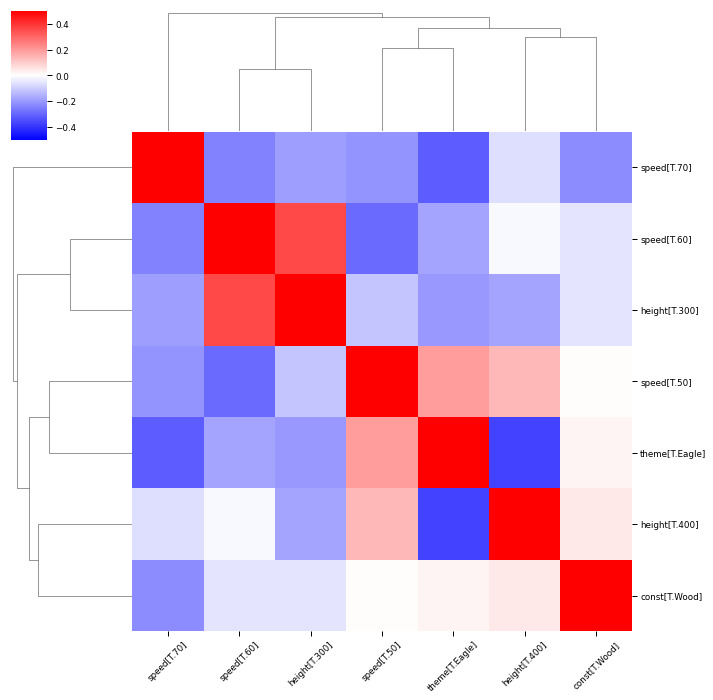

In [152]:
cg = sns.clustermap(ride_hlm_2_f_re_df.iloc[:,1:].corr(), vmax=0.5,
                    vmin=-0.5,cmap=plt.cm.bwr, center=0)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.setp(cg.ax_heatmap.xaxis.get_majorticklabels(), rotation=45)